In [2]:
! pip install tensorflow imageio tensorflow_probability

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import time, PIL, imageio, glob
import numpy as np
import tensorflow as tf
import tensorflow_probability as tfp
import matplotlib.pyplot as plt


4422102/4422102 [==============================] - 0s 0us/step


(-0.5, 27.5, 27.5, -0.5)

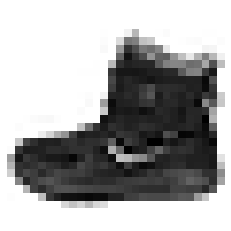

In [4]:
(train_images, _), (test_images, _) = tf.keras.datasets.fashion_mnist.load_data()

plt.imshow(train_images[0, :, :], cmap="gray_r")
plt.axis("off")

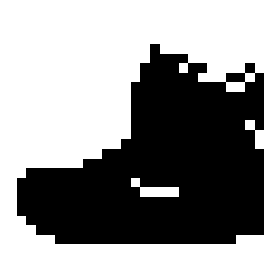

In [5]:
def preprocess_images(images): # Scale pixel values to be in the range of [0, 1]
  images = images.reshape(images.shape[0], 28, 28, 1) / 255.0
  return np.where(images > .5, 1.0, 0.0).astype('float32')

train_images = preprocess_images(train_images)
test_images = preprocess_images(test_images)

plt.imshow(train_images[0].squeeze(), cmap='gray_r')
plt.axis("off")
plt.tight_layout()

train_size = train_images.shape[0]
batch_size = 32
test_size = test_images.shape[0]

train_dataset = (tf.data.Dataset.from_tensor_slices(train_images).shuffle(train_size).batch(batch_size))
test_dataset = (tf.data.Dataset.from_tensor_slices(test_images).shuffle(train_size).batch(batch_size))

In [6]:
from re import S
from tensorflow.keras import Model, Sequential, layers

class CVAE(Model):
  """ Convolutional Variational AutoEncoder """

  def __init__(self, latent_dim: int = 2):
    super(CVAE, self).__init__()
    self.latent_dim = latent_dim
    self.encoder = Sequential(
            [layers.InputLayer(input_shape=(28, 28, 1)),
             layers.Conv2D(filters=32, kernel_size=3, strides=(2, 2), activation="leaky_relu"),
             layers.Conv2D(filters=64, kernel_size=3, strides=(2, 2), activation="leaky_relu"),
             layers.Flatten(),
             # No activation
             layers.Dense(latent_dim + latent_dim)
            ]
        )
    self.decoder = Sequential(
            [layers.InputLayer(input_shape=(latent_dim,)),
             layers.Dense(units=7*7*32, activation="leaky_relu"),
             layers.Reshape(target_shape=(7, 7, 32)),
             layers.Conv2DTranspose(filters=64, kernel_size=3, strides=2, padding="same"),
             layers.Conv2DTranspose(filters=32, kernel_size=3, strides=2, padding="same"),
             layers.Conv2DTranspose(filters=1, kernel_size=3, strides=1, padding="same"),
            ]
        )
    
  def encode(self, x):
    mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
    return mean, logvar
  
  def decode(self, z, apply_sigmoid=False):
    logits = self.decoder(z)
    if apply_sigmoid:
      probs = tf.sigmoid(logits)
      return probs

    return logits
    
  def reparametrize(self, mean, logvar):
    eps = tf.random.normal(shape=mean.shape)
    return eps * tf.exp(logvar * 0.5) + mean

  @tf.function
  def sample(self, z=None):
    if z is None:
      z = tf.random.normal(shape=(100, self.latent_dim))
    return self.decode(z, apply_sigmoid=True)

In [7]:
def log_normal_pdf(sample, mean, logvar, raxis=1):
    log2pi = tf.math.log(2. * np.pi)
    return tf.reduce_sum(
        -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
        axis=raxis)

In [8]:
def compute_loss(model, x):
    mean, logvar = model.encode(x)
    z = model.reparametrize(mean, logvar)
    x_logit = model.decode(z)
    cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
    logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
    logpz = log_normal_pdf(z, 0., 0.)
    logqz_x = log_normal_pdf(z, mean, logvar)
    return -tf.reduce_mean(logpx_z + logpz - logqz_x)

In [9]:
@tf.function
def train_step(model, x, optimizer):
  # Computes the loss and gradients, and uses that to update model parameters
  with tf.GradientTape() as g:
    loss = compute_loss(model, x)
  
  gradients = g.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [10]:
latent_dim = 2
epochs = 10

In [11]:
def plot_latent_images(model, n, epoch, im_size=28, save=True, first_epoch=False, f_ep_count=0):
    

    # Create image matrix 
    image_width = im_size*n
    image_height = image_width
    image = np.zeros((image_height, image_width))

    

    # Create list of values which are evenly spaced wrt probability mass

    norm = tfp.distributions.Normal(0, 1)
    grid_x = norm.quantile(np.linspace(0.05, 0.95, n))
    grid_y = norm.quantile(np.linspace(0.05, 0.95, n))


    # For each point on the grid in the latent space, decode and

    # copy the image into the image array
    for i, yi in enumerate(grid_x):
        for j, xi in enumerate(grid_y):
            z = np.array([[xi, yi]])
            x_decoded = model.sample(z) # produces an array twice the size.
            digit = tf.reshape(x_decoded[0], (im_size, im_size))
            image[i * im_size: (i + 1) * im_size,
                  j * im_size: (j + 1) * im_size] = digit.numpy()
    

    # Plot the image array
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='Greys_r')
    plt.axis('Off')


    # Potentially save, with different formatting if within first epoch
    if save and first_epoch:
        plt.savefig('tf_grid_at_epoch_{:04d}.{:04d}.png'.format(epoch, f_ep_count))
    elif save:
        plt.savefig('tf_grid_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

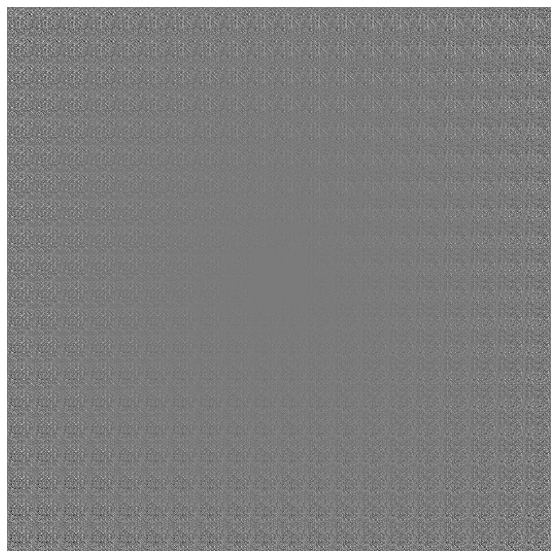

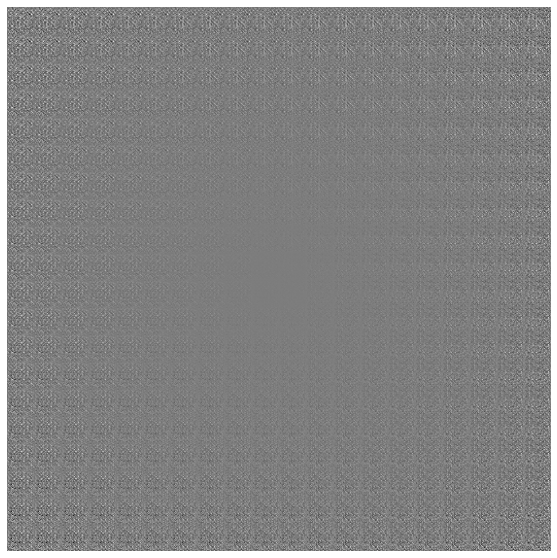

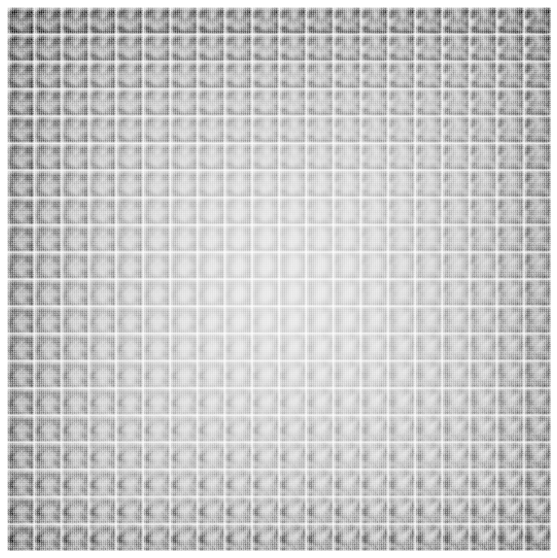

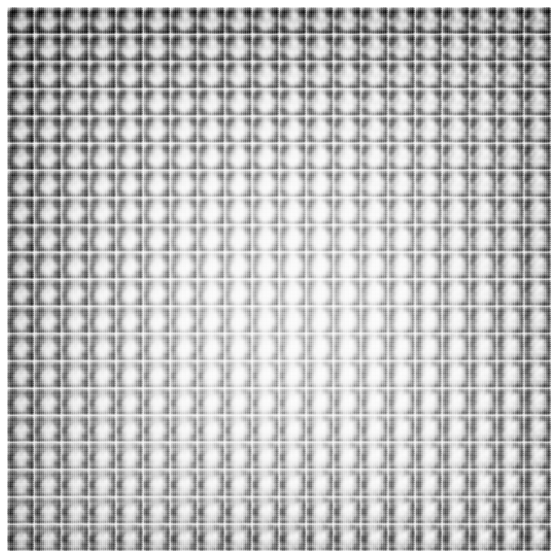

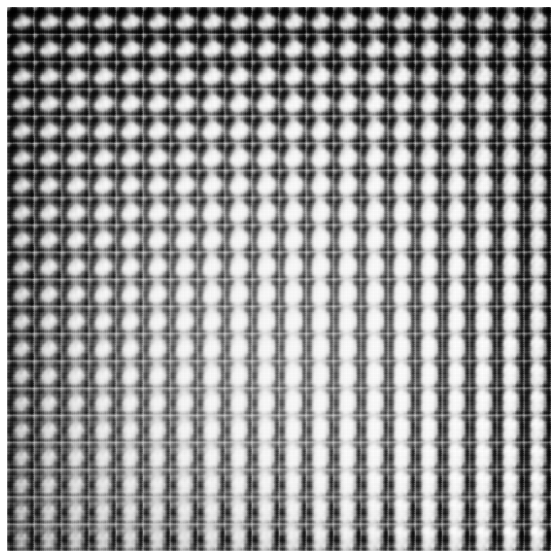

...

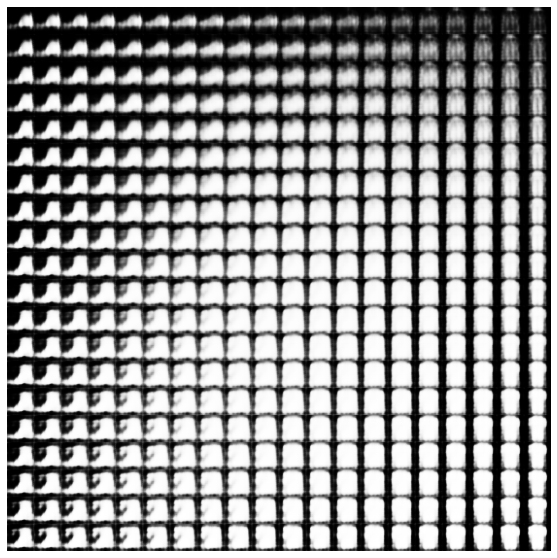

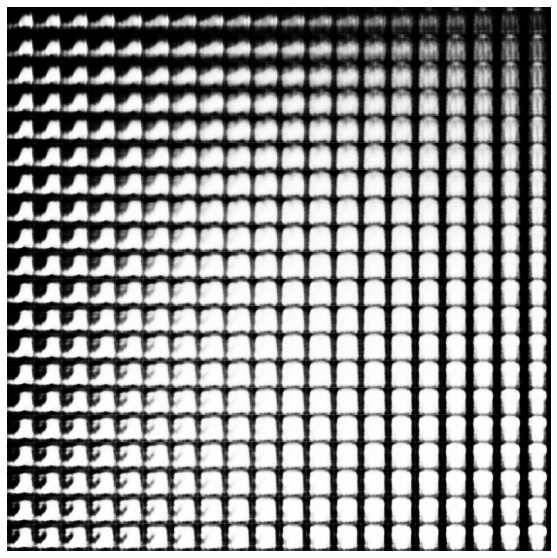

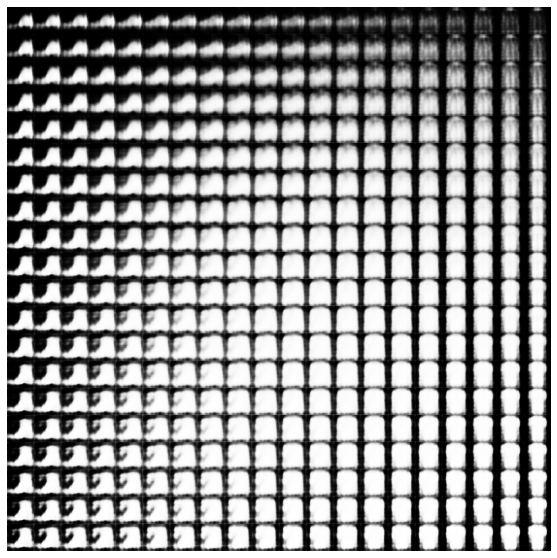

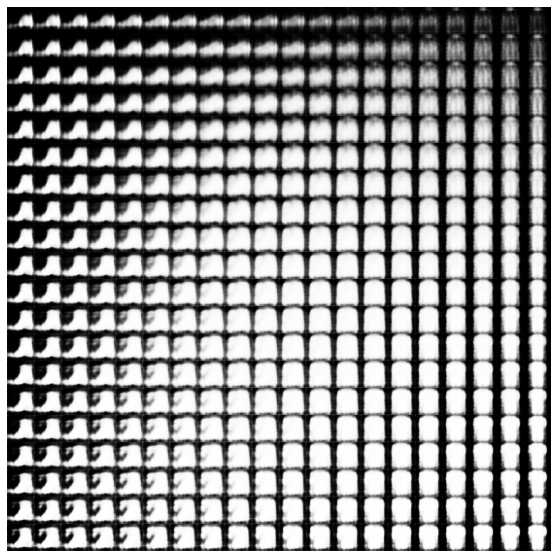

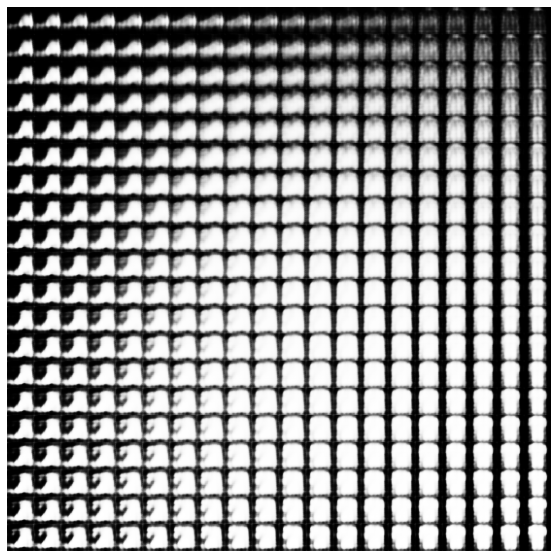

Epoch: 1, Test set ELBO: -225.58424377441406, time elapse for current epoch: 248.70973587036133
Epoch: 2, Test set ELBO: -215.63470458984375, time elapse for current epoch: 201.9068901538849


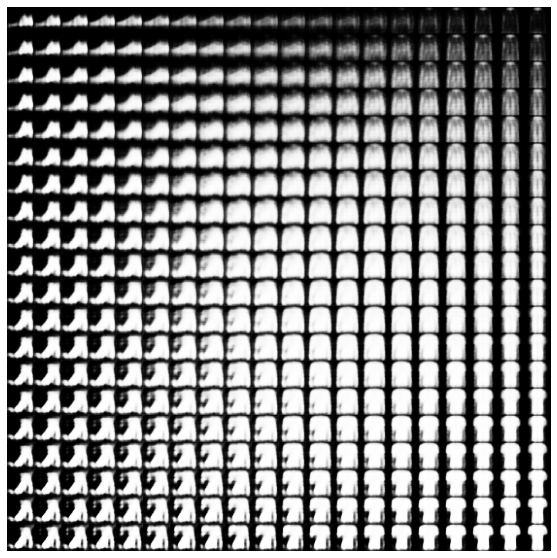

Epoch: 3, Test set ELBO: -208.80191040039062, time elapse for current epoch: 201.91786098480225


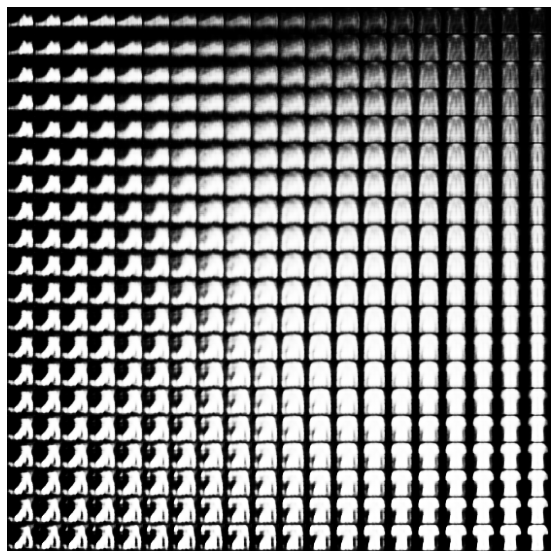

Epoch: 4, Test set ELBO: -204.24356079101562, time elapse for current epoch: 148.6938624382019


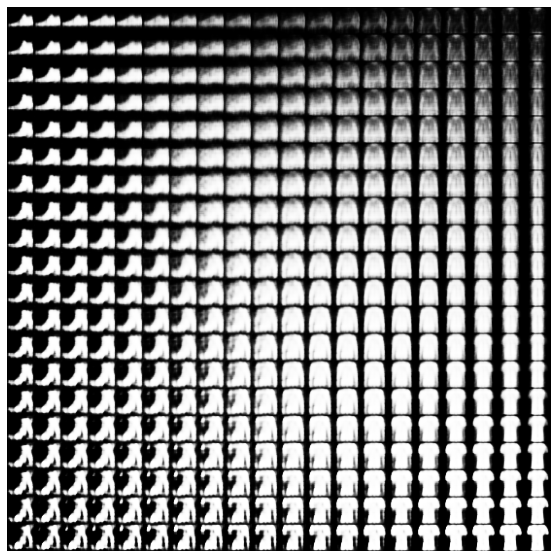

Epoch: 5, Test set ELBO: -201.58392333984375, time elapse for current epoch: 201.91512751579285


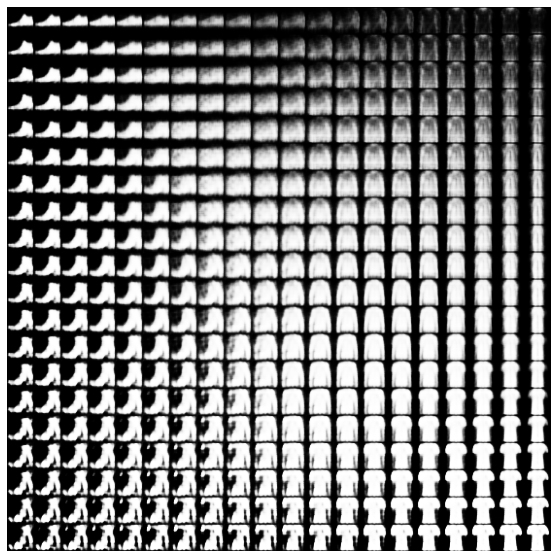

Epoch: 6, Test set ELBO: -198.99502563476562, time elapse for current epoch: 147.08791971206665


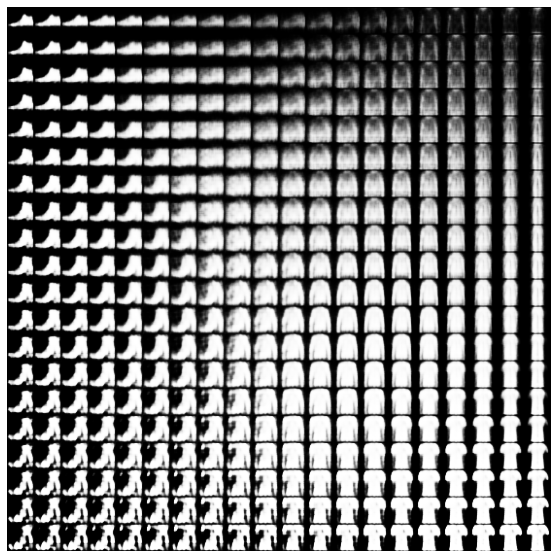

Epoch: 7, Test set ELBO: -197.8993377685547, time elapse for current epoch: 201.90917658805847


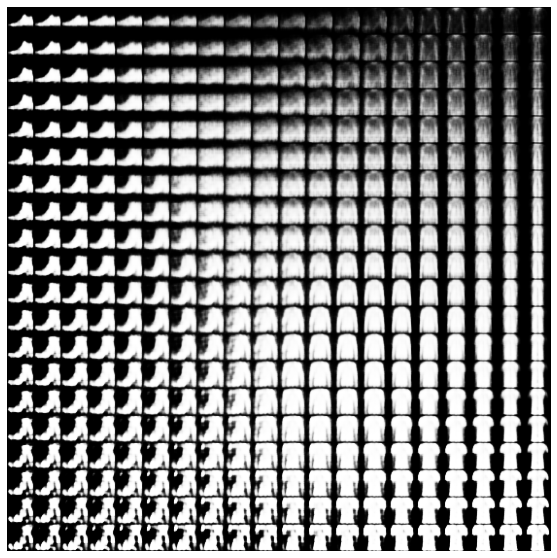

Epoch: 8, Test set ELBO: -196.7847137451172, time elapse for current epoch: 145.327561378479


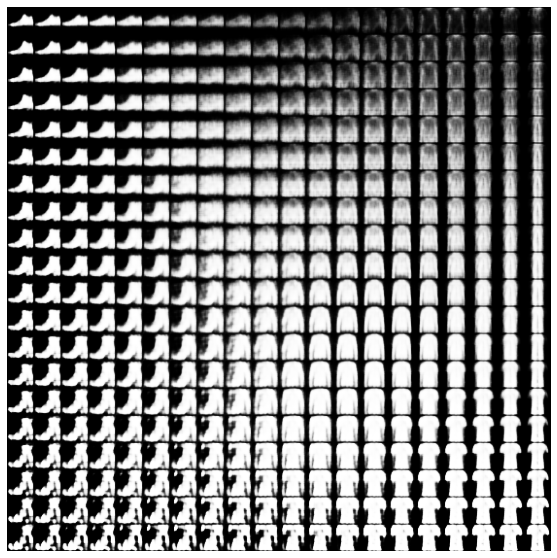

Epoch: 9, Test set ELBO: -195.97726440429688, time elapse for current epoch: 201.91187572479248


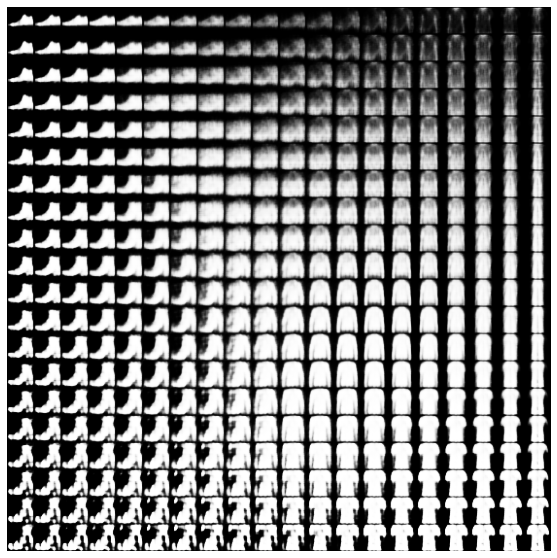

Epoch: 10, Test set ELBO: -195.14462280273438, time elapse for current epoch: 145.99006247520447


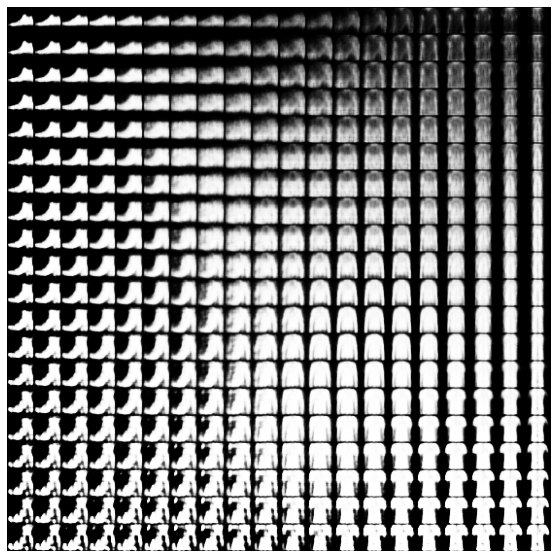

In [12]:
tf.config.run_functions_eagerly(True)
model = CVAE()
plot_latent_images(model, 20, epoch=0)


optimizer = tf.keras.optimizers.Adam(1e-4)

for epoch in range(1, epochs + 1):
    start_time = time.time()
    for idx, train_x in enumerate(train_dataset):
        train_step(model, train_x, optimizer)
        if epoch == 1 and idx % 75 == 0:
            plot_latent_images(model, 20, epoch=epoch, first_epoch=True, f_ep_count=idx)          
    end_time = time.time()
    loss = tf.keras.metrics.Mean()
    for test_x in test_dataset:
        loss(compute_loss(model, test_x))
    elbo = -loss.result()
    #display.clear_output(wait=False)
    print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
    if epoch != 1:
        plot_latent_images(model, 20, epoch=epoch)

In [13]:
anim_file = 'grid.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('tf_grid*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        print(filename)
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

tf_grid_at_epoch_0000.png
tf_grid_at_epoch_0001.0000.png
tf_grid_at_epoch_0001.0075.png
tf_grid_at_epoch_0001.0150.png
tf_grid_at_epoch_0001.0225.png
tf_grid_at_epoch_0001.0300.png
tf_grid_at_epoch_0001.0375.png
tf_grid_at_epoch_0001.0450.png
tf_grid_at_epoch_0001.0525.png
tf_grid_at_epoch_0001.0600.png
tf_grid_at_epoch_0001.0675.png
tf_grid_at_epoch_0001.0750.png
tf_grid_at_epoch_0001.0825.png
tf_grid_at_epoch_0001.0900.png
tf_grid_at_epoch_0001.0975.png
tf_grid_at_epoch_0001.1050.png
tf_grid_at_epoch_0001.1125.png
tf_grid_at_epoch_0001.1200.png
tf_grid_at_epoch_0001.1275.png
tf_grid_at_epoch_0001.1350.png
tf_grid_at_epoch_0001.1425.png
tf_grid_at_epoch_0001.1500.png
tf_grid_at_epoch_0001.1575.png
tf_grid_at_epoch_0001.1650.png
tf_grid_at_epoch_0001.1725.png
tf_grid_at_epoch_0001.1800.png
tf_grid_at_epoch_0002.png
tf_grid_at_epoch_0003.png
tf_grid_at_epoch_0004.png
tf_grid_at_epoch_0005.png
tf_grid_at_epoch_0006.png
tf_grid_at_epoch_0007.png
tf_grid_at_epoch_0008.png
tf_grid_at_epoch_